In [1]:
# Sentiment Analysis (NLP Model) - posts/comments @ Twitter.csv read

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
dataframe = pd.read_csv('dataset/twitter.csv')

In [4]:
dataframe

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation
...,...,...,...
31957,31958,0,ate @user isz that youuu?ðððððð...
31958,31959,0,to see nina turner on the airwaves trying to...
31959,31960,0,listening to sad songs on a monday morning otw...
31960,31961,1,"@user #sikh #temple vandalised in in #calgary,..."


In [5]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB


In [6]:
dataframe.describe()

,id,label
count,31962.000000,31962.000000
mean,15981.500000,0.070146
std,9226.778988,0.255397
min,1.000000,0.000000
25%,7991.250000,0.000000
50%,15981.500000,0.000000
75%,23971.750000,0.000000
max,31962.000000,1.000000


In [7]:
dataframe['tweet']

0         @user when a father is dysfunctional and is s...
1        @user @user thanks for #lyft credit i can't us...
2                                      bihday your majesty
3        #model   i love u take with u all the time in ...
4                   factsguide: society now    #motivation
                               ...                        
31957    ate @user isz that youuu?ðððððð...
31958      to see nina turner on the airwaves trying to...
31959    listening to sad songs on a monday morning otw...
31960    @user #sikh #temple vandalised in in #calgary,...
31961                     thank you @user for you follow  
Name: tweet, Length: 31962, dtype: object

In [3]:
dataframe = dataframe.drop(['id'], axis = 1)

In [4]:
dataframe

,label,tweet
0,0,@user when a father is dysfunctional and is s...
1,0,@user @user thanks for #lyft credit i can't us...
2,0,bihday your majesty
3,0,#model i love u take with u all the time in ...
4,0,factsguide: society now #motivation
...,...,...
31957,0,ate @user isz that youuu?ðððððð...
31958,0,to see nina turner on the airwaves trying to...
31959,0,listening to sad songs on a monday morning otw...
31960,1,"@user #sikh #temple vandalised in in #calgary,..."


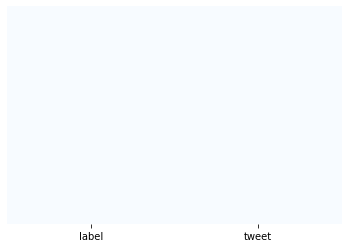

In [5]:
# Validate null dataframes (if available)
sns.heatmap(dataframe.isnull(), yticklabels = False, cbar = False, cmap = "Blues")

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff06c3563d0>]],
      dtype=object)

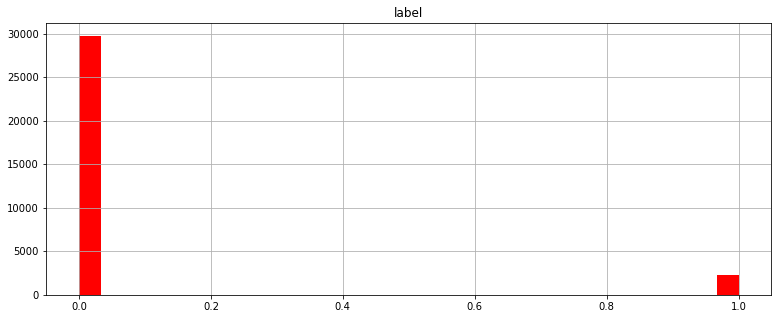

In [6]:
# Visualization for quantitative analysis of positive and negative sentiment figures
dataframe.hist(bins = 30, figsize = (13, 5), color = 'r')

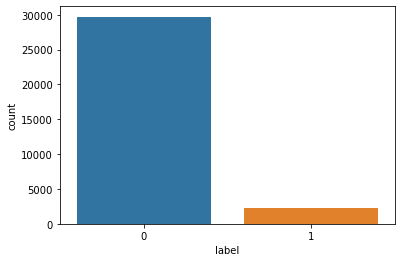

In [7]:
sns.countplot(dataframe['label'], label = 'Figures')

In [8]:
dataframe['length'] = dataframe['tweet'].apply(len)

In [9]:
# Adding length axis to the dataframe for key analysis
dataframe

,label,tweet,length
0,0,@user when a father is dysfunctional and is s...,102
1,0,@user @user thanks for #lyft credit i can't us...,122
2,0,bihday your majesty,21
3,0,#model i love u take with u all the time in ...,86
4,0,factsguide: society now #motivation,39
...,...,...,...
31957,0,ate @user isz that youuu?ðððððð...,68
31958,0,to see nina turner on the airwaves trying to...,131
31959,0,listening to sad songs on a monday morning otw...,63
31960,1,"@user #sikh #temple vandalised in in #calgary,...",67


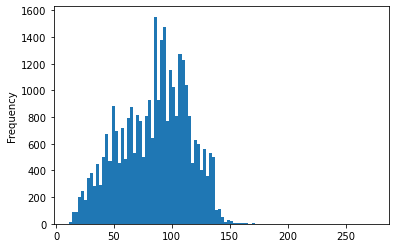

In [10]:
# Key length visualization
dataframe['length'].plot(bins = 100, kind='hist')

In [11]:
dataframe.describe()

,label,length
count,31962.000000,31962.000000
mean,0.070146,84.739628
std,0.255397,29.455749
min,0.000000,11.000000
25%,0.000000,63.000000
50%,0.000000,88.000000
75%,0.000000,108.000000
max,1.000000,274.000000


In [13]:
# Test for shortest message
dataframe[dataframe['length'] == 11]['tweet'].iloc[0]

'i love you '

In [16]:
# View the message with the average length
dataframe[dataframe['length'] == 84]['tweet'].iloc[0]

'my mom shares the same bihday as @user   bihday snake! see you this weekend ð\x9f\x99\x8cð\x9f\x8f¼'

In [21]:
# Dataframes generation for positive/negative sentiment analysis

positive_dataframe = dataframe[dataframe['label'] == 0]
negative_dataframe = dataframe[dataframe['label'] == 1]

In [26]:
strings = dataframe['tweet'].tolist()

In [29]:
len(strings)

31962

In [30]:
strings_str = " ".join(strings)

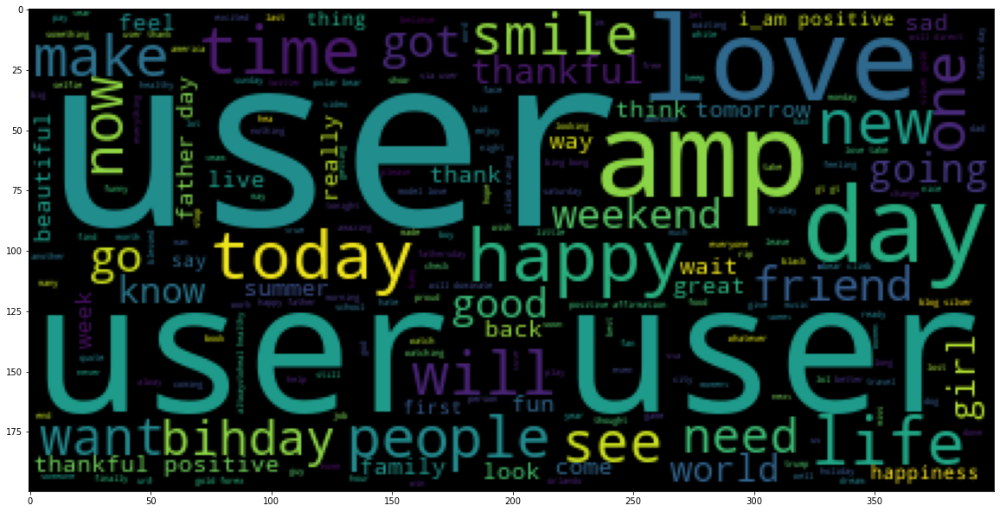

In [32]:
# visualization of the dataframes

from wordcloud import WordCloud
plt.figure(figsize=(20, 20))
plt.imshow(WordCloud().generate(strings_str))